In [3]:
import numpy as np 
import pandas as pd 

import os
for dirname, _, filenames in os.walk('E:\Tanaman Herbal\DATASET TANAMAN HERBAL\Data Training'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

E:\Tanaman Herbal\DATASET TANAMAN HERBAL\Data Training\Daun Jambu Biji\jambu biji (1).JPG
E:\Tanaman Herbal\DATASET TANAMAN HERBAL\Data Training\Daun Jambu Biji\jambu biji (10).JPG
E:\Tanaman Herbal\DATASET TANAMAN HERBAL\Data Training\Daun Jambu Biji\jambu biji (11).JPG
E:\Tanaman Herbal\DATASET TANAMAN HERBAL\Data Training\Daun Jambu Biji\jambu biji (12).JPG
E:\Tanaman Herbal\DATASET TANAMAN HERBAL\Data Training\Daun Jambu Biji\jambu biji (13).JPG
E:\Tanaman Herbal\DATASET TANAMAN HERBAL\Data Training\Daun Jambu Biji\jambu biji (14).JPG
E:\Tanaman Herbal\DATASET TANAMAN HERBAL\Data Training\Daun Jambu Biji\jambu biji (15).JPG
E:\Tanaman Herbal\DATASET TANAMAN HERBAL\Data Training\Daun Jambu Biji\jambu biji (16).JPG
E:\Tanaman Herbal\DATASET TANAMAN HERBAL\Data Training\Daun Jambu Biji\jambu biji (17).JPG
E:\Tanaman Herbal\DATASET TANAMAN HERBAL\Data Training\Daun Jambu Biji\jambu biji (18).JPG
E:\Tanaman Herbal\DATASET TANAMAN HERBAL\Data Training\Daun Jambu Biji\jambu biji (19).JPG


In [4]:
# Ignore  the warnings
import warnings
warnings.filterwarnings('always')
warnings.filterwarnings('ignore')

# data visualisation and manipulation
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import style
import seaborn as sns
 
#configure
# sets matplotlib to inline and displays graphs below the corressponding cell.
%matplotlib inline  
style.use('fivethirtyeight')
sns.set(style='whitegrid',color_codes=True)

#model selection
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.metrics import accuracy_score,precision_score,recall_score,confusion_matrix,classification_report,roc_curve,roc_auc_score
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import LabelEncoder

#preprocess.
from keras.preprocessing.image import ImageDataGenerator

#dl libraraies
from keras import backend as K
from keras.models import Sequential
from keras.layers import Dense
from tensorflow.keras.optimizers import Adam,SGD,Adagrad,Adadelta,RMSprop
from tensorflow.keras.utils import to_categorical

# specifically for cnn
from keras.layers import Dropout, Flatten,Activation
from keras.layers import Conv2D, MaxPooling2D, BatchNormalization
 
import tensorflow as tf
import random as rn

# specifically for manipulating zipped images and getting numpy arrays of pixel values of images.
import cv2                  
import numpy as np  
from tqdm import tqdm
import os                   
from random import shuffle  
from zipfile import ZipFile
from PIL import Image
import itertools

In [24]:
X=[]
Z=[]
IMG_SIZE=224
Daun_Jambu_Biji='E:\Tanaman Herbal\DATASET TANAMAN HERBAL\Data Training\Daun Jambu Biji'
Daun_Kari='E:\Tanaman Herbal\DATASET TANAMAN HERBAL\Data Training\Daun Kari'
Daun_Kemangi='E:\Tanaman Herbal\DATASET TANAMAN HERBAL\Data Training\Daun Kemangi'
Daun_Kunyit='E:\Tanaman Herbal\DATASET TANAMAN HERBAL\Data Training\Daun Kunyit'
Daun_Mint='E:\Tanaman Herbal\DATASET TANAMAN HERBAL\Data Training\Daun Mint'
Daun_Pepaya='E:\Tanaman Herbal\DATASET TANAMAN HERBAL\Data Training\Daun Pepaya'
Daun_Sirih='E:\Tanaman Herbal\DATASET TANAMAN HERBAL\Data Training\Daun Sirih'
Daun_Sirsak='E:\Tanaman Herbal\DATASET TANAMAN HERBAL\Data Training\Daun Sirsak'
Lidah_Buaya='E:\Tanaman Herbal\DATASET TANAMAN HERBAL\Data Training\Lidah Buaya'
Teh_Hijau='E:\Tanaman Herbal\DATASET TANAMAN HERBAL\Data Training\Teh Hijau'

In [25]:
def assign_label(img,tanaman_herbal):
    return tanaman_herbal

In [26]:
def make_train_data(tanaman_herbal,DIR):
    for img in tqdm(os.listdir(DIR)):
        label=assign_label(img,tanaman_herbal)
        path = os.path.join(DIR,img)
        img = cv2.imread(path,cv2.IMREAD_COLOR)
        img = cv2.resize(img, (IMG_SIZE,IMG_SIZE))
        
        X.append(np.array(img))
        Z.append(str(label))

In [27]:
make_train_data('Daun Jambu Biji',Daun_Jambu_Biji)
print(len(X))

100%|██████████| 80/80 [00:18<00:00,  4.31it/s]

80


In [28]:
make_train_data('Daun Kari',Daun_Kari)
print(len(X))

100%|██████████| 80/80 [00:19<00:00,  4.13it/s]

160


In [29]:
make_train_data('Daun Kemangi',Daun_Kemangi)
print(len(X))

100%|██████████| 80/80 [00:11<00:00,  6.97it/s]

240


In [30]:
make_train_data('Daun Kunyit',Daun_Kunyit)
print(len(X))

100%|██████████| 80/80 [00:20<00:00,  3.98it/s]

320


In [31]:
make_train_data('Daun Mint',Daun_Mint)
print(len(X))

100%|██████████| 80/80 [00:01<00:00, 43.48it/s]

400


In [32]:
make_train_data('Daun Pepaya',Daun_Pepaya)
print(len(X))

100%|██████████| 80/80 [00:20<00:00,  3.83it/s]

480


In [33]:
make_train_data('Daun Sirih',Daun_Sirih)
print(len(X))

100%|██████████| 80/80 [00:11<00:00,  6.97it/s]

560


In [34]:
make_train_data('Daun Sirsak',Daun_Sirsak)
print(len(X))

100%|██████████| 80/80 [00:20<00:00,  3.90it/s]

640


In [35]:
make_train_data('Lidah Buaya',Lidah_Buaya)
print(len(X))

100%|██████████| 80/80 [00:20<00:00,  3.95it/s]

720


In [36]:
make_train_data('Teh Hijau',Teh_Hijau)
print(len(X))

100%|██████████| 80/80 [00:01<00:00, 42.41it/s]

800


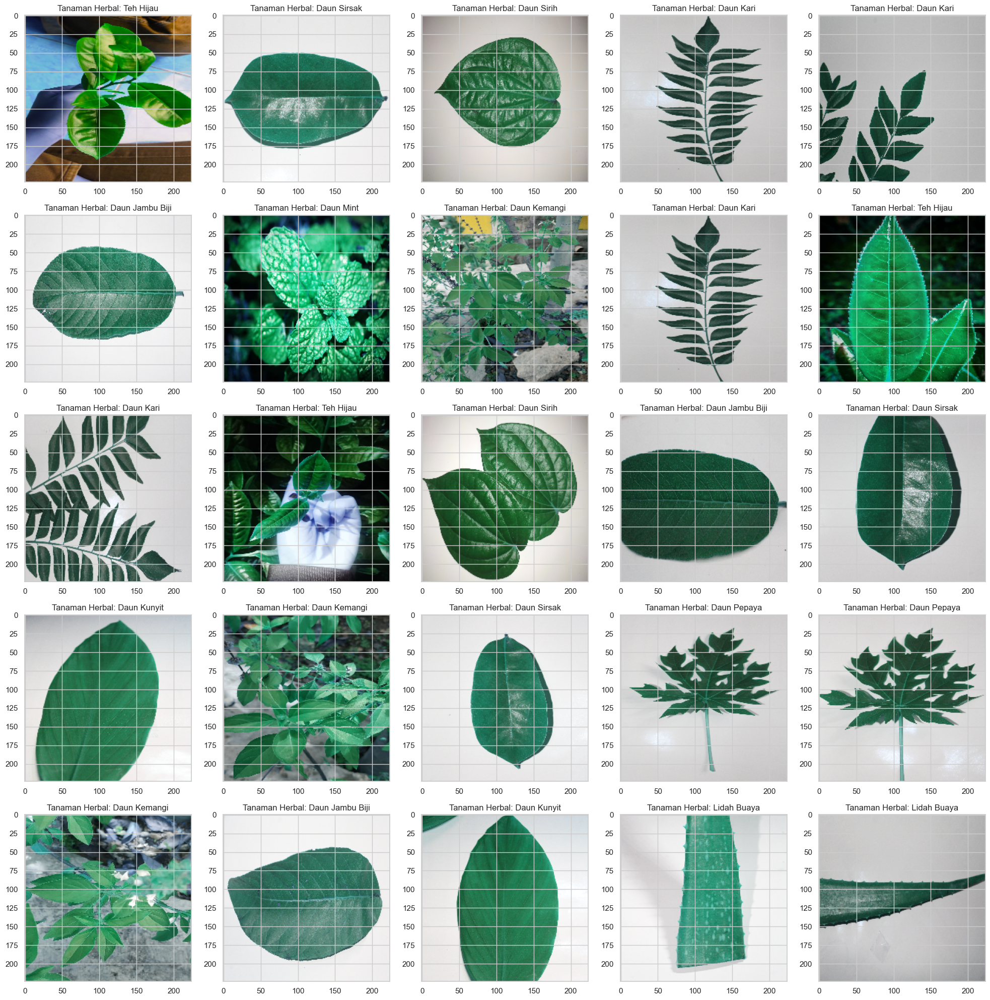

In [37]:
fig,ax=plt.subplots(5,5)
fig.set_size_inches(20,20)
for i in range(5):
    for j in range (5):
        l=rn.randint(0,len(Z))
        ax[i,j].imshow(X[l])
        ax[i,j].set_title('Tanaman Herbal: '+Z[l])
        
plt.tight_layout()

In [38]:
le=LabelEncoder()
Y=le.fit_transform(Z)
Y=to_categorical(Y,10)
X=np.array(X)
X=X/255

In [39]:
x_train,x_test,y_train,y_test=train_test_split(X,Y,test_size=0.25,random_state=10)

In [40]:
np.random.seed(10)
rn.seed(10)
tf.random.set_seed(10)

In [41]:
# # modelling starts using a CNN.

model = Sequential()
model.add(Conv2D(filters = 32, kernel_size = (17,17),padding = 'Same',activation ='relu', input_shape = (224,224,3)))
model.add(MaxPooling2D(pool_size=(2,2)))

model.add(Conv2D(filters = 64, kernel_size = (3,3),padding = 'Same',activation ='relu'))
model.add(MaxPooling2D(pool_size=(2,2), strides=(2,2)))
 
model.add(Conv2D(filters =96, kernel_size = (3,3),padding = 'Same',activation ='relu'))
model.add(MaxPooling2D(pool_size=(2,2), strides=(2,2)))

model.add(Conv2D(filters = 96, kernel_size = (3,3),padding = 'Same',activation ='relu'))
model.add(MaxPooling2D(pool_size=(2,2), strides=(2,2)))

model.add(Flatten())
model.add(Dense(512))
model.add(Activation('relu'))
model.add(Dense(10, activation = "softmax"))

In [42]:
from keras.callbacks import ReduceLROnPlateau
red_lr= ReduceLROnPlateau(monitor='val_acc',patience=3,verbose=1,factor=0.1)

In [43]:
datagen = ImageDataGenerator(
        featurewise_center=False,  # set input mean to 0 over the dataset
        samplewise_center=False,  # set each sample mean to 0
        featurewise_std_normalization=False,  # divide inputs by std of the dataset
        samplewise_std_normalization=False,  # divide each input by its std
        zca_whitening=False,  # apply ZCA whitening
        rotation_range=10,  # randomly rotate images in the range (degrees, 0 to 180)
        zoom_range = 0.1, # Randomly zoom image 
        width_shift_range=0.2,  # randomly shift images horizontally (fraction of total width)
        height_shift_range=0.2,  # randomly shift images vertically (fraction of total height)
        horizontal_flip=True,  # randomly flip images
        vertical_flip=False)  # randomly flip images

datagen.fit(x_train)

In [44]:
model.compile(optimizer=Adam(lr=0.001),loss='categorical_crossentropy',metrics=['accuracy'])

In [45]:
batch=20
epoch=80
step = np.ceil(x_train.shape[0]/batch)
History = model.fit_generator(
    datagen.flow(x_train,y_train, batch_size=batch),
    epochs = epoch,
    validation_data = (x_test,y_test),
    verbose = 1,
    steps_per_epoch=step
)

Epoch 1/80
30/30 [==============================] - 123s 4s/step - loss: 2.3173 - accuracy: 0.1233 - val_loss: 2.2557 - val_accuracy: 0.1800
Epoch 2/80
30/30 [==============================] - 131s 4s/step - loss: 2.0178 - accuracy: 0.2967 - val_loss: 1.7990 - val_accuracy: 0.3800
Epoch 3/80
30/30 [==============================] - 126s 4s/step - loss: 1.6508 - accuracy: 0.3567 - val_loss: 1.4386 - val_accuracy: 0.4300
Epoch 4/80
30/30 [==============================] - 131s 4s/step - loss: 1.3885 - accuracy: 0.4633 - val_loss: 1.4162 - val_accuracy: 0.4250
Epoch 5/80
30/30 [==============================] - 126s 4s/step - loss: 1.3254 - accuracy: 0.4917 - val_loss: 1.4661 - val_accuracy: 0.4650
Epoch 6/80
30/30 [==============================] - 125s 4s/step - loss: 1.1911 - accuracy: 0.5733 - val_loss: 1.1218 - val_accuracy: 0.5250
Epoch 7/80
30/30 [==============================] - 127s 4s/step - loss: 1.0939 - accuracy: 0.6100 - val_loss: 0.9124 - val_accuracy: 0.6750
Epoch 8/80
30

In [48]:
model.save('E:\Tanaman Herbal\model\Tanaman_Herbal.h5')

In [50]:
saved_model_dir = 'E:/Tanaman Herbal/model/'
tf.saved_model.save(model, saved_model_dir)

converter = tf.lite.TFLiteConverter.from_saved_model(saved_model_dir)
tflite_model = converter.convert()

with open('model.tflite', 'wb') as f:
  f.write(tflite_model)

target_names = ['Daun Jambu Biji','Daun Kari','Daun Kemangi','Daun Kunyit','Daun Mint','Daun Pepaya','Daun Sirih','Daun Sirsak','Lidah Buaya','Teh Hijau']
labels = '\n'.join(target_names)

with open('labels.txt', 'w') as f:
  f.write(labels)

INFO:tensorflow:Assets written to: E:/Tanaman Herbal/model/assets


INFO:tensorflow:Assets written to: E:/Tanaman Herbal/model/assets


In [51]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 224, 224, 32)      27776     
                                                                 
 max_pooling2d (MaxPooling2  (None, 112, 112, 32)      0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 112, 112, 64)      18496     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 56, 56, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 56, 56, 96)        55392     
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 28, 28, 96)        0

In [52]:
Y_pred = model.predict_generator(x_test)
y_pred = np.argmax(Y_pred, axis=1)
y_test = np.argmax(y_test, axis=1)
cm = confusion_matrix(y_test, y_pred)
print(cm)

[[11  0  0  1  0  0  0  2  0  0]
 [ 0 19  0  0  0  0  0  0  0  0]
 [ 0  0 24  0  1  0  0  0  0  2]
 [ 1  0  1 22  0  0  0  2  2  0]
 [ 0  0  3  0 10  0  1  0  0  3]
 [ 0  0  0  0  0 23  0  0  0  0]
 [ 0  0  0  0  0  0 22  0  0  0]
 [ 0  0  0  0  0  0  0 18  0  0]
 [ 1  0  0  0  0  0  0  0 15  0]
 [ 0  0  0  0  0  0  0  0  0 16]]


In [53]:
print(classification_report(y_test, y_pred, target_names=target_names))

                 precision    recall  f1-score   support

Daun Jambu Biji       0.85      0.79      0.81        14
      Daun Kari       1.00      1.00      1.00        19
   Daun Kemangi       0.86      0.89      0.87        27
    Daun Kunyit       0.96      0.79      0.86        28
      Daun Mint       0.91      0.59      0.71        17
    Daun Pepaya       1.00      1.00      1.00        23
     Daun Sirih       0.96      1.00      0.98        22
    Daun Sirsak       0.82      1.00      0.90        18
    Lidah Buaya       0.88      0.94      0.91        16
      Teh Hijau       0.76      1.00      0.86        16

       accuracy                           0.90       200
      macro avg       0.90      0.90      0.89       200
   weighted avg       0.91      0.90      0.90       200



In [54]:


def plot_confusion_matrix(cm, classes, normalize=True, title='Confusion matrix', cmap=plt.cm.Blues):

    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """

    plt.figure(figsize=(8,8))
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()

    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=90)
    plt.yticks(tick_marks, classes)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        cm = np.around(cm, decimals=2)
        cm[np.isnan(cm)] = 0.0
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')
    thresh = cm.max() / 2.

    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")
    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

Normalized confusion matrix


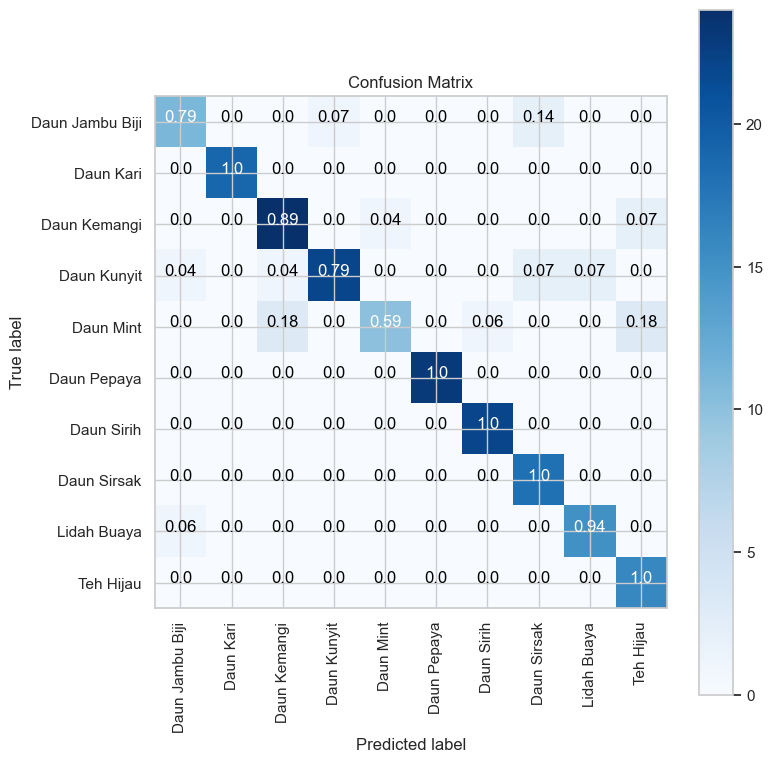

In [55]:
plot_confusion_matrix(cm, target_names, title='Confusion Matrix')

In [56]:
new_model = tf.keras.models.load_model('E:/Tanaman Herbal/model/Tanaman_Herbal.h5')

In [57]:
new_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 224, 224, 32)      27776     
                                                                 
 max_pooling2d (MaxPooling2  (None, 112, 112, 32)      0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 112, 112, 64)      18496     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 56, 56, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 56, 56, 96)        55392     
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 28, 28, 96)        0

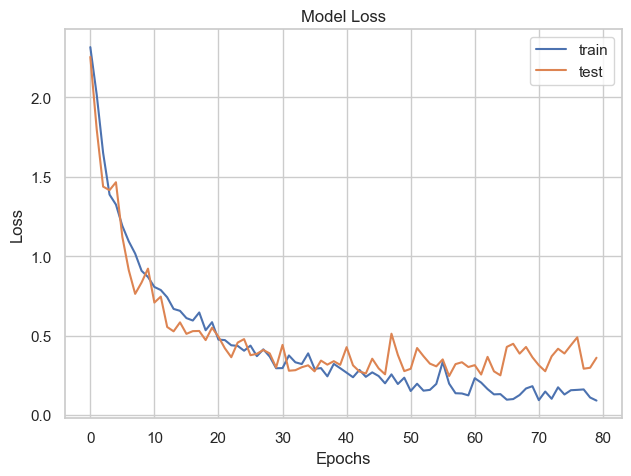

In [58]:
plt.plot(History.history['loss'])
plt.plot(History.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epochs')
plt.legend(['train', 'test'])
plt.show()

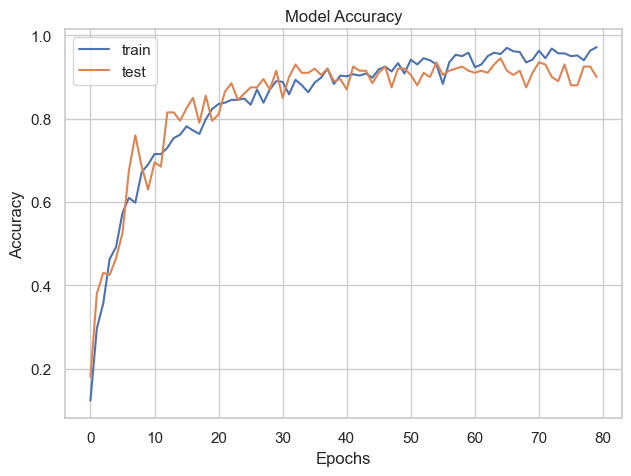

In [59]:
plt.plot(History.history['accuracy'])
plt.plot(History.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epochs')
plt.legend(['train', 'test'])
plt.show()

In [60]:
pred=new_model.predict(x_test)
pred_digits=np.argmax(pred,axis=1)

7/7 [==============================] - 9s 1s/step


In [61]:
i=0
prop_class=[]
mis_class=[]

for i in range(len(y_test)):
    if(np.argmax(y_test[i])==pred_digits[i]):
        prop_class.append(i)
    if(len(prop_class)==8):
        break

i=0
for i in range(len(y_test)):
    if(not np.argmax(y_test[i])==pred_digits[i]):
        mis_class.append(i)
    if(len(mis_class)==8):
        break

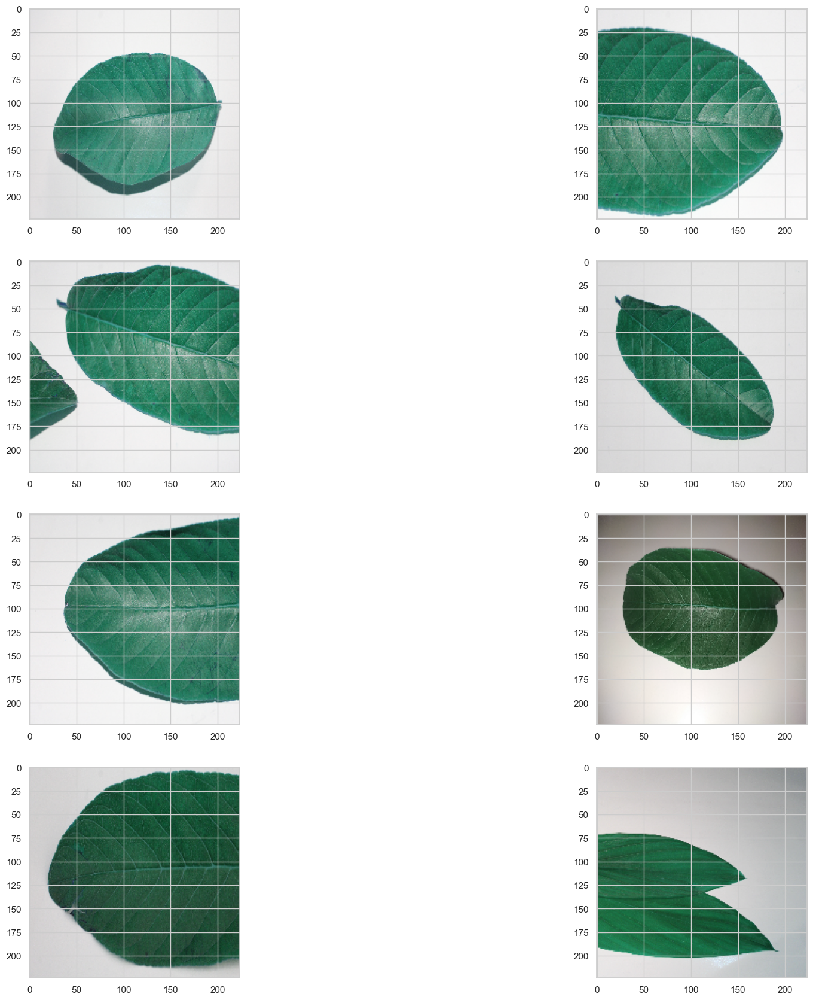

In [62]:
warnings.filterwarnings('always')
warnings.filterwarnings('ignore')

count=0
fig,ax=plt.subplots(4,2)
fig.set_size_inches(20,20)
for i in range (4):
    for j in range (2):
        ax[i,j].imshow(x_test[prop_class[count]])
      
        count+=1

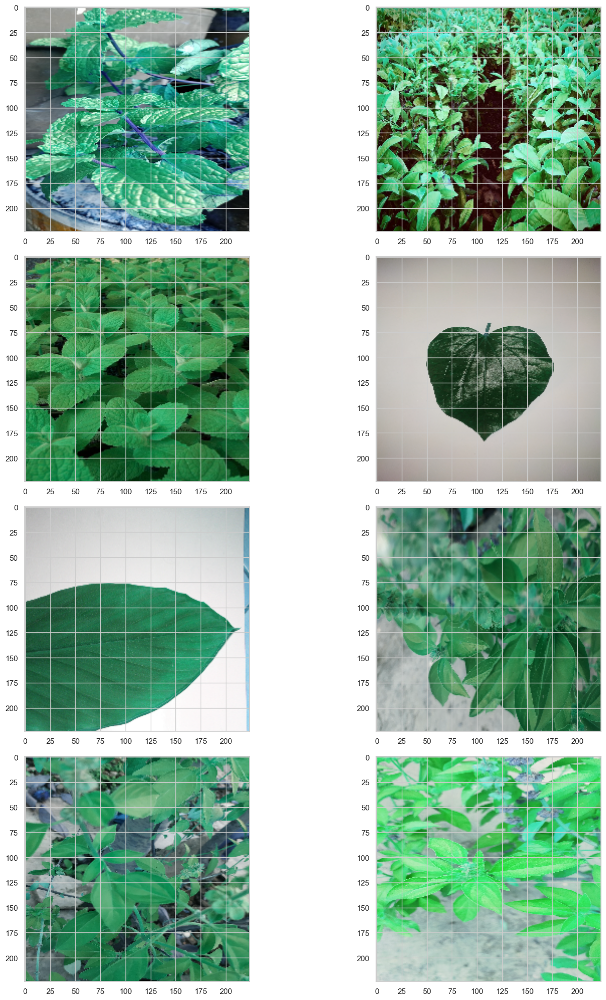

In [63]:
warnings.filterwarnings('always')
warnings.filterwarnings('ignore')

count=0
fig,ax=plt.subplots(4,2)
fig.set_size_inches(20,20)
for i in range (4):
    for j in range (2):
        ax[i,j].imshow(x_test[mis_class[count]])
        plt.tight_layout()
        count+=1

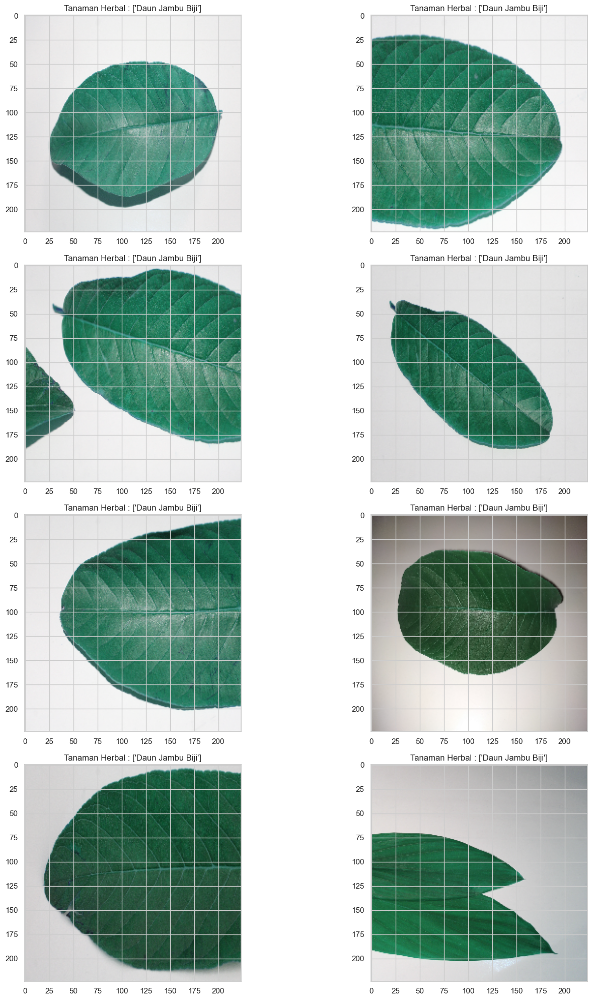

In [64]:
warnings.filterwarnings('always')
warnings.filterwarnings('ignore')

count=0
fig,ax=plt.subplots(4,2)
fig.set_size_inches(20,20)
for i in range (4):
    for j in range (2):
        ax[i,j].imshow(x_test[prop_class[count]])
        ax[i,j].set_title("Tanaman Herbal : "+str(le.inverse_transform([pred_digits[prop_class[count]]])))
        plt.tight_layout()
        count+=1